> From the PO.DAAC Cookbook, to access the GitHub version of the notebook, follow [this link](https://github.com/podaac/tutorials/blob/master/notebooks/datasets/SWOTHR_localmachine.ipynb). 

# SWOT Hydrology Dataset Exploration on a local machine

## Accessing and Visualizing SWOT Datasets

### Requirement:
Local compute environment e.g. laptop, server: this tutorial can be run on your local machine.

### Learning Objectives:
- Access SWOT HR data prodcuts (archived in NASA Earthdata Cloud) within the AWS cloud, by downloading to local machine
- Visualize accessed data for a quick check

#### SWOT Level 2 KaRIn High Rate Version 2.0 Datasets:

1. **River Vector Shapefile** - SWOT_L2_HR_RIVERSP_2.0

2. **Lake Vector Shapefile** - SWOT_L2_HR_LAKESP_2.0

3. **Water Mask Pixel Cloud NetCDF** - SWOT_L2_HR_PIXC_2.0

4. **Water Mask Pixel Cloud Vector Attribute NetCDF** - SWOT_L2_HR_PIXCVec_2.0

5. **Raster NetCDF** - SWOT_L2_HR_Raster_2.0

6. **Single Look Complex Data product** - SWOT_L1B_HR_SLC_2.0

_Notebook Author: Cassie Nickles, NASA PO.DAAC (Feb 2024) || Other Contributors: Zoe Walschots (PO.DAAC Summer Intern 2023), Catalina Taglialatela (NASA PO.DAAC), Luis Lopez (NASA NSIDC DAAC)_

_Last updated: 7 Feb 2024_
  

### Libraries Needed

In [1]:
import glob
import h5netcdf
import xarray as xr
import pandas as pd
import geopandas as gpd
import contextily as cx
import numpy as np
import matplotlib.pyplot as plt
import hvplot.xarray
import zipfile
import earthaccess

### Earthdata Login

An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. If you don't already have one, please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up. We use `earthaccess` to authenticate your login credentials below.

In [2]:
auth = earthaccess.login()

### Single File Access

#### **1. River Vector Shapefiles**

The https access link can be found using `earthaccess` data search. Since this collection consists of Reach and Node files, we need to extract only the granule for the Reach file. We do this by filtering for the 'Reach' title in the data link.

Alternatively, Earthdata Search [(see tutorial)](https://nasa-openscapes.github.io/2021-Cloud-Workshop-AGU/tutorials/01_Earthdata_Search.html) can be used to manually search in a GUI interface.

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for the data of interest

In [3]:
#Retrieves granule from the day we want, in this case by passing to `earthdata.search_data` function the data collection shortname, temporal bounds, and filter by wildcards
river_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_RIVERSP_2.0', 
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        granule_name = '*Reach*_009_NA*') # here we filter by Reach files (not node), pass=009, continent code=NA

Granules found: 5


#### Dowload, unzip, read the data

Let's download the first data file! `earthaccess.download` has a list as the input format, so we need to put brackets around the single file we pass.

In [6]:
earthaccess.download([river_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.01 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['SWOT_L2_HR_RiverSP_Reach_007_009_NA_20231123T172635_20231123T172636_PIC0_01.zip']

The native format for this data is a .zip file, and we want the .shp file within the .zip file, so we must first extract the data to open it. First, we'll programmatically get the filename we just downloaded, and then extract all data to the `data_downloads` folder.

In [7]:
filename = earthaccess.results.DataGranule.data_links(river_results[0], access='external')
filename = filename[0].split("/")[-1]
filename

'SWOT_L2_HR_RiverSP_Reach_007_009_NA_20231123T172635_20231123T172636_PIC0_01.zip'

In [8]:
with zipfile.ZipFile(f'data_downloads/{filename}', 'r') as zip_ref:
    zip_ref.extractall('data_downloads')

Open the shapefile using `geopandas`

In [9]:
filename_shp = filename.replace('.zip','.shp')

In [10]:
SWOT_HR_shp1 = gpd.read_file(f'data_downloads/{filename_shp}') 

#view the attribute table
SWOT_HR_shp1 

,reach_id,time,time_tai,time_str,p_lat,p_lon,river_name,wse,wse_u,wse_r_u,...,p_wid_var,p_n_nodes,p_dist_out,p_length,p_maf,p_dam_id,p_n_ch_max,p_n_ch_mod,p_low_slp,geometry
0,71224500951,-1.000000e+12,-1.000000e+12,no_data,48.517717,-93.692086,Rainy River,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,1480.031,53,244919.492,10586.381484,-1.000000e+12,0,1,1,0,"LINESTRING (-93.76076 48.51651, -93.76035 48.5..."
1,71224700013,7.540761e+08,7.540762e+08,2023-11-23T17:35:38Z,48.777900,-93.233350,no_data,3.364954e+02,9.003000e-02,2.290000e-03,...,1239358.412,18,3719.676,3514.736672,-1.000000e+12,0,6,1,0,"LINESTRING (-93.21387 48.78466, -93.21403 48.7..."
2,71224700021,7.540761e+08,7.540762e+08,2023-11-23T17:35:38Z,48.772163,-93.266891,no_data,3.365123e+02,9.199000e-02,1.902000e-02,...,76609.119,8,5305.752,1586.075688,-1.000000e+12,0,6,1,0,"LINESTRING (-93.25587 48.77340, -93.25628 48.7..."
3,71224700033,7.540761e+08,7.540762e+08,2023-11-23T17:35:38Z,48.733727,-93.116424,no_data,3.365715e+02,9.068000e-02,1.112000e-02,...,297730.945,20,306795.237,3904.961218,-1.000000e+12,0,3,1,0,"LINESTRING (-93.09779 48.73888, -93.09820 48.7..."
4,71224700041,7.540761e+08,7.540762e+08,2023-11-23T17:35:38Z,48.720271,-93.113458,no_data,3.364742e+02,9.085000e-02,1.238000e-02,...,0.000,6,302890.276,1203.102119,-1.000000e+12,0,1,1,0,"LINESTRING (-93.12101 48.72305, -93.12060 48.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,77125000241,7.540756e+08,7.540756e+08,2023-11-23T17:26:38Z,17.960957,-100.025397,no_data,3.560650e+02,1.501928e+02,1.501928e+02,...,864.151,70,464330.310,13953.442643,-1.000000e+12,0,2,1,0,"LINESTRING (-100.06409 17.97308, -100.06403 17..."
927,77125000254,-1.000000e+12,-1.000000e+12,no_data,17.949648,-99.995193,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,21491.314,2,464735.375,405.065100,-1.000000e+12,10286,1,1,0,"LINESTRING (-99.99547 17.95148, -99.99564 17.9..."
928,77125000261,7.540756e+08,7.540756e+08,2023-11-23T17:26:47Z,18.362207,-100.696472,no_data,2.316304e+02,9.208000e-02,1.946000e-02,...,3624.715,56,325106.825,11105.124379,-1.000000e+12,0,4,1,0,"LINESTRING (-100.68734 18.40208, -100.68723 18..."
929,77125000263,-1.000000e+12,-1.000000e+12,no_data,17.956269,-99.961388,no_data,-1.000000e+12,-1.000000e+12,-1.000000e+12,...,43956.311,49,474450.182,9714.807127,-1.000000e+12,0,2,1,0,"LINESTRING (-99.99398 17.94824, -99.99369 17.9..."


#### Quickly plot the SWOT river data

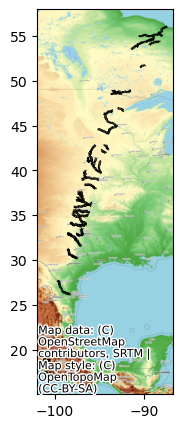

In [16]:
# Simple plot
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp1.plot(ax=ax, color='black')
cx.add_basemap(ax, crs=SWOT_HR_shp1.crs, source=cx.providers.OpenTopoMap)

In [ ]:
# Another way to plot geopandas dataframes is with `explore`, which also plots a basemap
#SWOT_HR_shp1.explore()

#### **2. Lake Vector Shapefiles**

The lake vector shapefiles can be accessed in the same way as the river shapefiles above.

For additional tips on spatial searching of SWOT HR L2 data, see also [PO.DAAC Cookbook - SWOT Chapter tips section](https://podaac.github.io/tutorials/quarto_text/SWOT.html#tips-for-swot-hr-spatial-search).

#### Search for data of interest

In [4]:
lake_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_LAKESP_2.0', 
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        granule_name = '*Obs*_009_NA*') # here we filter by files with 'Obs' in the name (This collection has three options: Obs, Unassigned, and Prior), pass #8 and continent code=NA

Granules found: 2


Let's download the first data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [18]:
earthaccess.download([lake_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.06 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['SWOT_L2_HR_LakeSP_Obs_008_009_NA_20231214T141139_20231214T142322_PIC0_01.zip']

The native format for this data is a .zip file, and we want the .shp file within the .zip file, so we must first extract the data to open it. First, we'll programmatically get the filename we just downloaded, and then extract all data to the `SWOT_downloads` folder.

In [19]:
filename2 = earthaccess.results.DataGranule.data_links(lake_results[0], access='external')
filename2 = filename2[0].split("/")[-1]
filename2

'SWOT_L2_HR_LakeSP_Obs_008_009_NA_20231214T141139_20231214T142322_PIC0_01.zip'

In [20]:
with zipfile.ZipFile(f'data_downloads/{filename2}', 'r') as zip_ref:
    zip_ref.extractall('data_downloads')

Open the shapefile using `geopandas`

In [21]:
filename_shp2 = filename2.replace('.zip','.shp')
filename_shp2

'SWOT_L2_HR_LakeSP_Obs_008_009_NA_20231214T141139_20231214T142322_PIC0_01.shp'

In [22]:
SWOT_HR_shp2 = gpd.read_file(f'data_downloads/{filename_shp2}') 

#view the attribute table
SWOT_HR_shp2

,obs_id,lake_id,overlap,n_overlap,reach_id,time,time_tai,time_str,wse,wse_u,...,load_tidef,load_tideg,pole_tide,dry_trop_c,wet_trop_c,iono_c,xovr_cal_c,lake_name,p_res_id,geometry
0,771190L999978,7710050732;7710050703;7710050672;7710050662;77...,9;86;79;70;65,5,no_data,7.558783e+08,7.558783e+08,2023-12-14T14:12:29Z,1888.880,0.002,...,-0.016630,-0.018661,0.004459,-1.865485,-0.153819,-0.005181,-1.116717,PRESA SOLS,-99999999,"MULTIPOLYGON (((-100.49406 20.07574, -100.4938..."
1,752199L999957,7520013722;7520013783,66;17,2,no_data,7.558784e+08,7.558784e+08,2023-12-14T14:14:08Z,156.216,0.034,...,-0.014181,-0.015942,0.005326,-2.293956,-0.252575,-0.004943,-0.351363,no_data,-99999999,"MULTIPOLYGON (((-99.37239 25.63900, -99.37194 ..."
2,752200L999987,7520013712,59,1,no_data,7.558784e+08,7.558784e+08,2023-12-14T14:14:09Z,171.336,0.095,...,-0.014314,-0.016066,0.005341,-2.289045,-0.249914,-0.004935,-0.555793,no_data,-99999999,"MULTIPOLYGON (((-99.39476 25.73965, -99.39442 ..."
3,752200L999975,7520010832,75,1,no_data,7.558784e+08,7.558784e+08,2023-12-14T14:14:09Z,173.704,0.092,...,-0.014527,-0.016270,0.005346,-2.288555,-0.249523,-0.004927,-0.880471,no_data,-99999999,"MULTIPOLYGON (((-99.49457 25.75364, -99.49435 ..."
4,752201L999995,7520010502,97,1,no_data,7.558785e+08,7.558785e+08,2023-12-14T14:14:20Z,86.140,0.183,...,-0.014221,-0.015947,0.005429,-2.310065,-0.251561,-0.004908,-0.461625,no_data,-99999999,"MULTIPOLYGON (((-99.18978 26.22343, -99.18885 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24067,713255R000242,7131518382,98,1,no_data,7.558790e+08,7.558790e+08,2023-12-14T14:23:21Z,8.600,0.058,...,-0.003146,-0.002480,0.008959,-2.268371,-0.101818,-0.002132,0.371395,no_data,-99999999,"POLYGON ((-88.09984 56.45882, -88.09993 56.458..."
24068,713255R000243,7131518562,88,1,no_data,7.558790e+08,7.558790e+08,2023-12-14T14:23:21Z,7.569,0.046,...,-0.002484,-0.002016,0.011788,-2.268953,-0.101874,-0.002134,0.536599,no_data,-99999999,"POLYGON ((-88.02194 56.44447, -88.02154 56.444..."
24069,713255R000252,7131519822,96,1,no_data,7.558790e+08,7.558790e+08,2023-12-14T14:23:21Z,7.010,0.056,...,-0.002542,-0.002187,0.010853,-2.268864,-0.101836,-0.002132,0.410241,no_data,-99999999,"POLYGON ((-88.07451 56.46812, -88.07396 56.467..."
24070,713255R000253,7131519842,92,1,no_data,7.558790e+08,7.558790e+08,2023-12-14T14:23:21Z,4.540,0.118,...,-0.001758,-0.001693,0.012287,-2.269519,-0.101934,-0.002135,0.580966,no_data,-99999999,"POLYGON ((-87.98967 56.45438, -87.98932 56.454..."


#### Quickly plot the SWOT lakes data

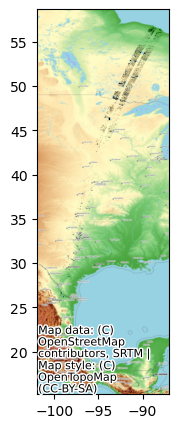

In [23]:
fig, ax = plt.subplots(figsize=(7,5))
SWOT_HR_shp2.plot(ax=ax, color='black')
cx.add_basemap(ax, crs=SWOT_HR_shp2.crs, source=cx.providers.OpenTopoMap)

Accessing the remaining files is different than the shp files above. We do not need to extract the shapefiles from a zip file because the following SWOT HR collections are stored in **netCDF** files in the cloud. For the rest of the products, we will open via `xarray`, not `geopandas`.

#### **3. Water Mask Pixel Cloud NetCDF**

#### Search for data collection and time of interest

In [5]:
pixc_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXC_2.0', 
                                        #granule_name = '*_009_*', # pass number 9 if we want to filter further
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 18


Let's download one data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [29]:
earthaccess.download([pixc_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.27 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['SWOT_L2_HR_PIXC_007_106_086R_20231127T042024_20231127T042035_PIC0_03.nc']

#### Open data using xarray

The pixel cloud netCDF files are formatted with three groups titled, "pixel cloud", "tvp", or "noise" (more detail [here](https://podaac-tools.jpl.nasa.gov/drive/files/misc/web/misc/swot_mission_docs/pdd/D-56411_SWOT_Product_Description_L2_HR_PIXC_20200810.pdf)). In order to access the coordinates and variables within the file, a group must be specified when calling xarray open_dataset.

In [33]:
ds_PIXC = xr.open_mfdataset("data_downloads/SWOT_L2_HR_PIXC_*.nc", group = 'pixel_cloud', engine='h5netcdf')
ds_PIXC

<xarray.Dataset>
Dimensions:                                (points: 2831150, complex_depth: 2,
                                            num_pixc_lines: 3279)
Coordinates:
    latitude                               (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
    longitude                              (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
Dimensions without coordinates: points, complex_depth, num_pixc_lines
Data variables: (12/61)
    azimuth_index                          (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
    range_index                            (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
    interferogram                          (points, complex_depth) float32 dask.array<chunksize=(2831150, 2), meta=np.ndarray>
    power_plus_y                           (points) float32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    power_minus_y                          (points) float32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    coherent_power                         (points) float32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    ...                                     ...
    pixc_line_qual                         (num_pixc_lines) float64 dask.array<chunksize=(3279,), meta=np.ndarray>
    pixc_line_to_tvp                       (num_pixc_lines) float32 dask.array<chunksize=(3279,), meta=np.ndarray>
    data_window_first_valid                (num_pixc_lines) float64 dask.array<chunksize=(3279,), meta=np.ndarray>
    data_window_last_valid                 (num_pixc_lines) float64 dask.array<chunksize=(3279,), meta=np.ndarray>
    data_window_first_cross_track          (num_pixc_lines) float32 dask.array<chunksize=(3279,), meta=np.ndarray>
    data_window_last_cross_track           (num_pixc_lines) float32 dask.array<chunksize=(3279,), meta=np.ndarray>
Attributes:
    description:                 cloud of geolocated interferogram pixels
    interferogram_size_azimuth:  3279
    interferogram_size_range:    5750
    looks_to_efflooks:           1.5509548020673398
    num_azimuth_looks:           7.0
    azimuth_offset:              3

#### Simple plot of the results

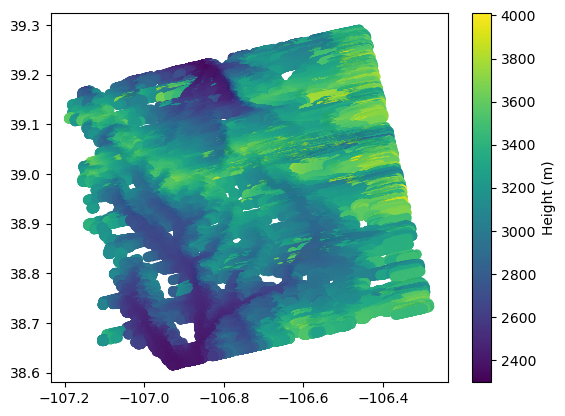

In [34]:
# This could take a few minutes to plot
plt.scatter(x=ds_PIXC.longitude, y=ds_PIXC.latitude, c=ds_PIXC.height)
plt.colorbar().set_label('Height (m)')

#### **4. Water Mask Pixel Cloud Vector Attribute NetCDF**

#### Search for data of interest

In [6]:
pixcvec_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_PIXCVEC_2.0', 
                                        #granule_name = '*_009_*', # pass number 9 if we want to filter further
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 19


Let's download the first data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [38]:
earthaccess.download([pixcvec_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.21 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['SWOT_L2_HR_PIXCVec_007_106_086R_20231127T042024_20231127T042035_PIC0_04.nc']

#### Open data using xarray

First, we'll programmatically get the filename we just downloaded and then view the file via `xarray`.

In [39]:
ds_PIXCVEC = xr.open_mfdataset("data_downloads/SWOT_L2_HR_PIXCVec_*.nc", decode_cf=False,  engine='h5netcdf')
ds_PIXCVEC

<xarray.Dataset>
Dimensions:               (points: 2831150, nchar_reach_id: 11,
                           nchar_node_id: 14, nchar_lake_id: 10,
                           nchar_obs_id: 13)
Dimensions without coordinates: points, nchar_reach_id, nchar_node_id,
                                nchar_lake_id, nchar_obs_id
Data variables:
    azimuth_index         (points) int32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    range_index           (points) int32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    latitude_vectorproc   (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
    longitude_vectorproc  (points) float64 dask.array<chunksize=(2831150,), meta=np.ndarray>
    height_vectorproc     (points) float32 dask.array<chunksize=(2831150,), meta=np.ndarray>
    reach_id              (points, nchar_reach_id) |S1 dask.array<chunksize=(2831150, 11), meta=np.ndarray>
    node_id               (points, nchar_node_id) |S1 dask.array<chunksize=(2831150, 14), meta=np.ndarray>
    lake_id               (points, nchar_lake_id) |S1 dask.array<chunksize=(2831150, 10), meta=np.ndarray>
    obs_id                (points, nchar_obs_id) |S1 dask.array<chunksize=(2831150, 13), meta=np.ndarray>
    ice_clim_f            (points) int8 dask.array<chunksize=(2831150,), meta=np.ndarray>
    ice_dyn_f             (points) int8 dask.array<chunksize=(2831150,), meta=np.ndarray>
Attributes: (12/45)
    Conventions:                     CF-1.7
    title:                           Level 2 KaRIn high rate pixel cloud vect...
    short_name:                      L2_HR_PIXCVec
    institution:                     CNES
    source:                          Level 1B KaRIn High Rate Single Look Com...
    history:                         2023-12-03T05:59:43.712142Z: Creation
    ...                              ...
    xref_prior_river_db_file:        
    xref_prior_lake_db_file:         SWOT_LakeDatabase_Nom_106_20000101T00000...
    xref_reforbittrack_files:        SWOT_RefOrbitTrackTileBoundary_Nom_20000...
    xref_param_l2_hr_laketile_file:  SWOT_Param_L2_HR_LakeTile_20000101T00000...
    ellipsoid_semi_major_axis:       6378137.0
    ellipsoid_flattening:            0.0033528106647474805

#### Simple plot

In [45]:
pixcvec_htvals = ds_PIXCVEC.height_vectorproc.compute()
pixcvec_latvals = ds_PIXCVEC.latitude_vectorproc.compute()
pixcvec_lonvals = ds_PIXCVEC.longitude_vectorproc.compute()

#Before plotting, we set all fill values to nan so that the graph shows up better spatially
pixcvec_htvals[pixcvec_htvals > 15000] = np.nan
pixcvec_latvals[pixcvec_latvals < 1] = np.nan
pixcvec_lonvals[pixcvec_lonvals > -1] = np.nan

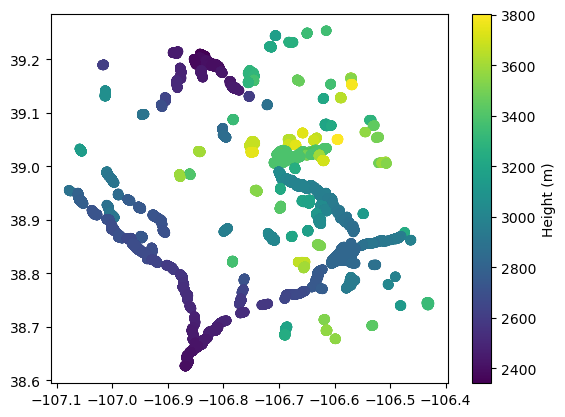

In [46]:
plt.scatter(x=pixcvec_lonvals, y=pixcvec_latvals, c=pixcvec_htvals)
plt.colorbar().set_label('Height (m)')

#### **5. Raster NetCDF**

#### Search for data of interest

In [7]:
raster_results = earthaccess.search_data(short_name = 'SWOT_L2_HR_Raster_2.0', 
                                        #temporal = ('2024-02-01 00:00:00', '2024-02-29 23:59:59'), # can also specify by time
                                        granule_name = '*100m*', # here we filter by files with '100m' in the name (This collection has two resolution options: 100m & 250m)
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 34


Let's download one data file.

In [49]:
earthaccess.download([raster_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 0.04 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['SWOT_L2_HR_Raster_100m_UTM13S_N_x_x_x_007_106_043F_20231127T042014_20231127T042035_PIC0_04.nc']

#### Open data with xarray

First, we'll programmatically get the filename we just downloaded and then view the file via `xarray`.

In [50]:
ds_raster = xr.open_mfdataset(f'data_downloads/SWOT_L2_HR_Raster*', engine='h5netcdf')
ds_raster

<xarray.Dataset>
Dimensions:                  (x: 1520, y: 1519)
Coordinates:
  * x                        (x) float64 2.969e+05 2.97e+05 ... 4.488e+05
  * y                        (y) float64 4.274e+06 4.274e+06 ... 4.426e+06
Data variables: (12/39)
    crs                      object ...
    longitude                (y, x) float64 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    latitude                 (y, x) float64 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    wse                      (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    wse_qual                 (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    wse_qual_bitwise         (y, x) float64 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    ...                       ...
    load_tide_fes            (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    load_tide_got            (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    pole_tide                (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    model_dry_tropo_cor      (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    model_wet_tropo_cor      (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
    iono_cor_gim_ka          (y, x) float32 dask.array<chunksize=(1519, 1520), meta=np.ndarray>
Attributes: (12/49)
    Conventions:                   CF-1.7
    title:                         Level 2 KaRIn High Rate Raster Data Product
    source:                        Ka-band radar interferometer
    history:                       2023-12-03T08:26:57Z : Creation
    platform:                      SWOT
    references:                    V1.1.1
    ...                            ...
    x_min:                         296900.0
    x_max:                         448800.0
    y_min:                         4274000.0
    y_max:                         4425800.0
    institution:                   CNES
    product_version:               04

#### Quick interactive plot with `hvplot`

In [51]:
ds_raster.wse.hvplot.image(y='y', x='x')

:Image   [x,y]   (wse)

#### **6. SLC**

#### Search for data collection and time of interest

In [8]:
slc_results = earthaccess.search_data(short_name = 'SWOT_L1B_HR_SLC_2.0', 
                                        #temporal = ('2024-01-01 00:00:00', '2024-01-30 23:59:59'), # can also specify by time
                                        #granule_name = '*_009_*', # here we can additionally filter by pass number 009
                                        bounding_box = (-106.62, 38.809, -106.54, 38.859)) # Lake Travis near Austin, TX

Granules found: 36


Let's download one data file! earthaccess.download has a list as the input format, so we need to put brackets around the single file we pass.

In [9]:
earthaccess.download([slc_results[0]], "./data_downloads")

 Getting 1 granules, approx download size: 2.25 GB


QUEUEING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

File SWOT_L1B_HR_SLC_001_412_087L_20230804T221253_20230804T221304_PGC0_01.nc already downloaded


PROCESSING TASKS | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/1 [00:00<?, ?it/s]

['data_downloads\\SWOT_L1B_HR_SLC_001_412_087L_20230804T221253_20230804T221304_PGC0_01.nc']

#### Open data using xarray
The L1B_HR_SLC product file contains five NetCDF data group called the slc, xfactor, noise, tvp, and grdem groups. More info can be found in the [product description document within the dataset table](https://podaac.jpl.nasa.gov/SWOT?tab=datasets) for each group.

In [10]:
ds_SLC = xr.open_mfdataset("data_downloads/SWOT_L1B_HR_SLC*.nc", group = 'slc', engine='h5netcdf')
ds_SLC

<xarray.Dataset>
Dimensions:      (num_lines: 22956, num_pixels: 5623, complex_depth: 2)
Dimensions without coordinates: num_lines, num_pixels, complex_depth
Data variables:
    slc_plus_y   (num_lines, num_pixels, complex_depth) float32 dask.array<chunksize=(22956, 5623, 2), meta=np.ndarray>
    slc_minus_y  (num_lines, num_pixels, complex_depth) float32 dask.array<chunksize=(22956, 5623, 2), meta=np.ndarray>
    slc_qual     (num_lines) float32 dask.array<chunksize=(22956,), meta=np.ndarray>
Attributes:
    description:  Single look complex images for plus_y and minus_y channels